<a href="https://colab.research.google.com/github/nannaphasb/workshop2-data-cleansing/blob/main/workshop_data_cleansing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Data Cleansing Workshop : Apache Spark

Apache Spark is an open-source unified analytics engine designed for large-scale data processing.


## Step 1 : Install Spark and PySpark

In [1]:
!apt-get update                                                                          # update all Package in the VM
!apt-get install openjdk-8-jdk-headless -qq > /dev/null                                  # install Java Development Kit (required)
!wget -q https://archive.apache.org/dist/spark/spark-3.5.1/spark-3.5.1-bin-hadoop3.tgz   # install Spark 3.5.1
!tar xzvf spark-3.5.1-bin-hadoop3.tgz                                                    # Unzip Spark 3.5.1
!pip install -q findspark                                                                # install Package Python for Spark

# Set enviroment variable
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
os.environ["SPARK_HOME"] = "/content/spark-3.5.1-bin-hadoop3"

# Install PySpark version 3.5.1 for Python
!pip install pyspark==3.5.1

Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:4 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Get:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease [18.1 kB]
Get:9 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,089 kB]
Get:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease [24.3 kB]
Get:11 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [1,889 kB]
Hit:12 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:13 https://cloud.r-project.org/bin/

In [2]:
# # display information about system's CPU
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0xffffffff
cpu MHz		: 2199.998
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmio_stale_data retbleed bhi
bogomips	: 4399.99
clflush size	: 64
cache_alignment	: 64
ad

In [3]:
# create Spark Session
from pyspark.sql import SparkSession
spark = SparkSession.builder \
    .master("local[*]") \
      .appName("Data Cleansing with Apache Spark") \
    .getOrCreate()

In [4]:
import sys
sys.version_info

sys.version_info(major=3, minor=10, micro=12, releaselevel='final', serial=0)

In [5]:
spark.version

'3.5.1'

### Download and read data

In [6]:
!wget https://file.designil.com/f/6BamyF+ -O w2_input.parquet

--2024-06-11 07:49:24--  https://file.designil.com/f/6BamyF+
Resolving file.designil.com (file.designil.com)... 172.67.130.97, 104.21.8.81, 2606:4700:3031::6815:851, ...
Connecting to file.designil.com (file.designil.com)|172.67.130.97|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-std.droplr.net/files/acc_513973/6BamyF [following]
--2024-06-11 07:49:24--  https://cdn-std.droplr.net/files/acc_513973/6BamyF
Resolving cdn-std.droplr.net (cdn-std.droplr.net)... 18.173.166.4, 18.173.166.90, 18.173.166.39, ...
Connecting to cdn-std.droplr.net (cdn-std.droplr.net)|18.173.166.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6040473 (5.8M) [application/octet-stream]
Saving to: ‘w2_input.parquet’

w2_input.parquet    100%[===================>]   5.76M  34.0MB/s    in 0.2s    

2024-06-11 07:49:25 (34.0 MB/s) - ‘w2_input.parquet’ saved [6040473/6040473]



In [7]:
dt = spark.read.parquet('w2_input.parquet')
dt

DataFrame[transaction_id: string, date: string, product_id: string, price: double, quantity: bigint, customer_id: double, product_name: string, customer_country: string, customer_name: string, total_amount: double, thb_amount: double]

In [8]:
dt.show(10)

+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|transaction_id|      date|product_id|price|quantity|customer_id|        product_name|customer_country|customer_name|      total_amount|        thb_amount|
+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|        581482|2024-05-10|     22485|21.47|      12|    17490.0|Set Of 2 Wooden M...|  United Kingdom| Sara Griffin|            257.64|        11792.1828|
|        581475|2024-05-10|     22596|10.65|      36|    13069.0|Christmas Star Wi...|  United Kingdom| Michael Holt|383.40000000000003|17548.218000000004|
|        581475|2024-05-10|     23235|11.53|      12|    13069.0|Storage Tin Vinta...|  United Kingdom| Michael Holt|138.35999999999999|         6332.7372|
|        581475|2024-05-10|     23272|10.65|      12|    13069.0

## Step 2 : Data Profiling

Data profiling is the process of examining, analyzing, and summarizing data to understand its characteristics and quality.

In [9]:
dt

DataFrame[transaction_id: string, date: string, product_id: string, price: double, quantity: bigint, customer_id: double, product_name: string, customer_country: string, customer_name: string, total_amount: double, thb_amount: double]

In [10]:
dt.show()

+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|transaction_id|      date|product_id|price|quantity|customer_id|        product_name|customer_country|customer_name|      total_amount|        thb_amount|
+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|        581482|2024-05-10|     22485|21.47|      12|    17490.0|Set Of 2 Wooden M...|  United Kingdom| Sara Griffin|            257.64|        11792.1828|
|        581475|2024-05-10|     22596|10.65|      36|    13069.0|Christmas Star Wi...|  United Kingdom| Michael Holt|383.40000000000003|17548.218000000004|
|        581475|2024-05-10|     23235|11.53|      12|    13069.0|Storage Tin Vinta...|  United Kingdom| Michael Holt|138.35999999999999|         6332.7372|
|        581475|2024-05-10|     23272|10.65|      12|    13069.0

In [11]:
dt.show(truncate = False)

+--------------+----------+----------+-----+--------+-----------+-----------------------------------+----------------+-------------+------------------+------------------+
|transaction_id|date      |product_id|price|quantity|customer_id|product_name                       |customer_country|customer_name|total_amount      |thb_amount        |
+--------------+----------+----------+-----+--------+-----------+-----------------------------------+----------------+-------------+------------------+------------------+
|581482        |2024-05-10|22485     |21.47|12      |17490.0    |Set Of 2 Wooden Market Crates      |United Kingdom  |Sara Griffin |257.64            |11792.1828        |
|581475        |2024-05-10|22596     |10.65|36      |13069.0    |Christmas Star Wish List Chalkboard|United Kingdom  |Michael Holt |383.40000000000003|17548.218000000004|
|581475        |2024-05-10|23235     |11.53|12      |13069.0    |Storage Tin Vintage Leaf           |United Kingdom  |Michael Holt |138.359999999

In [12]:
# show data types
dt.dtypes

[('transaction_id', 'string'),
 ('date', 'string'),
 ('product_id', 'string'),
 ('price', 'double'),
 ('quantity', 'bigint'),
 ('customer_id', 'double'),
 ('product_name', 'string'),
 ('customer_country', 'string'),
 ('customer_name', 'string'),
 ('total_amount', 'double'),
 ('thb_amount', 'double')]

In [13]:
# show schema
dt.printSchema()

root
 |-- transaction_id: string (nullable = true)
 |-- date: string (nullable = true)
 |-- product_id: string (nullable = true)
 |-- price: double (nullable = true)
 |-- quantity: long (nullable = true)
 |-- customer_id: double (nullable = true)
 |-- product_name: string (nullable = true)
 |-- customer_country: string (nullable = true)
 |-- customer_name: string (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- thb_amount: double (nullable = true)



In [15]:
# df.shape
print((dt.count(), len(dt.columns)))

(536350, 11)


In [16]:
# statistical data summarization
dt.describe().show()

+-------+------------------+----------+------------------+------------------+------------------+------------------+--------------------+----------------+-------------+------------------+--------------------+
|summary|    transaction_id|      date|        product_id|             price|          quantity|       customer_id|        product_name|customer_country|customer_name|      total_amount|          thb_amount|
+-------+------------------+----------+------------------+------------------+------------------+------------------+--------------------+----------------+-------------+------------------+--------------------+
|  count|            536350|    536350|            536350|            536350|            536350|            536295|              536350|          536350|       536350|            536350|              536350|
|   mean| 559978.9296258752|      NULL|27501.334602703962|12.662182287696377| 9.919347441036637|15227.893178194838|                NULL|            NULL|         NULL|1

In [17]:
# statistical data summarization
dt.summary().show()

+-------+------------------+----------+------------------+------------------+------------------+------------------+--------------------+----------------+-------------+------------------+--------------------+
|summary|    transaction_id|      date|        product_id|             price|          quantity|       customer_id|        product_name|customer_country|customer_name|      total_amount|          thb_amount|
+-------+------------------+----------+------------------+------------------+------------------+------------------+--------------------+----------------+-------------+------------------+--------------------+
|  count|            536350|    536350|            536350|            536350|            536350|            536295|              536350|          536350|       536350|            536350|              536350|
|   mean| 559978.9296258752|      NULL|27501.334602703962|12.662182287696377| 9.919347441036637|15227.893178194838|                NULL|            NULL|         NULL|1

In [18]:
# note : can use with summary( ) as well
dt.select('price').describe().show()

+-------+------------------+
|summary|             price|
+-------+------------------+
|  count|            536350|
|   mean|12.662182287696377|
| stddev| 8.490450200816936|
|    min|              5.13|
|    max|            660.62|
+-------+------------------+



### Check null values

In [20]:
dt.summary('count').show()

+-------+--------------+------+----------+------+--------+-----------+------------+----------------+-------------+------------+----------+
|summary|transaction_id|  date|product_id| price|quantity|customer_id|product_name|customer_country|customer_name|total_amount|thb_amount|
+-------+--------------+------+----------+------+--------+-----------+------------+----------------+-------------+------------+----------+
|  count|        536350|536350|    536350|536350|  536350|     536295|      536350|          536350|       536350|      536350|    536350|
+-------+--------------+------+----------+------+--------+-----------+------------+----------------+-------------+------------+----------+



In [23]:
dt.where(dt.customer_id.isNull()).show()

+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+-------------------+-------------------+
|transaction_id|      date|product_id|price|quantity|customer_id|        product_name|customer_country|customer_name|       total_amount|         thb_amount|
+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+-------------------+-------------------+
|       C581406|2024-05-09|    46000M| 6.19|    -240|       NULL|Polyester Filler ...|  United Kingdom| Allen Morgan|-1485.6000000000001|         -68397.024|
|       C581406|2024-05-09|    46000S| 6.19|    -300|       NULL|Polyester Filler ...|  United Kingdom| Allen Morgan|-1857.0000000000002| -85496.28000000001|
|       C575153|2024-04-09|     22947|44.25|      -1|       NULL|Wooden Advent Cal...|  United Kingdom| Allen Morgan|             -44.25|-2036.4734999999998|
|       C574288|2024-04-04|     22178|25.37|      -1

In [24]:
dt.where(dt.customer_id.isNull()).count()

55

### YData Profiling

YData Profiling is a powerful tool designed to streamline the process of understanding and exploring your data

In [25]:
!pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 9.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 11.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=9a86785dce84f6264b5635d278e371a5f2dfc239d8e35813fd698a6157aa6f17
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [26]:
from ydata_profiling import ProfileReport
profile = ProfileReport(dt.toPandas(), title='Profiling Report')

In [27]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Step 3 : EDA - Exploratory Data Analysis

It's a crucial initial step in data science projects that involves analyzing and investigating datasets to understand their key characteristics. It's like getting to know your data before diving into complex modeling or analysis.

- Non-Graphic EDA

In [31]:
dt.where(dt.price >= 100).show()
print('There are',dt.where(dt.price >= 100).count(), 'records')

+--------------+----------+----------+------+--------+-----------+--------------------+----------------+--------------------+------------+------------------+
|transaction_id|      date|product_id| price|quantity|customer_id|        product_name|customer_country|       customer_name|total_amount|        thb_amount|
+--------------+----------+----------+------+--------+-----------+--------------------+----------------+--------------------+------------+------------------+
|        577130|2024-04-18|     22827|179.37|       1|    15861.0|Rustic Seventeen ...|  United Kingdom|        Kelly Barnes|      179.37|        8207.79183|
|       C577131|2024-04-18|     22827|179.37|      -1|    15861.0|Rustic Seventeen ...|  United Kingdom|        Kelly Barnes|     -179.37|       -8207.79183|
|        576635|2024-04-17|     22828|158.88|       2|    15269.0|Regency Mirror Wi...|  United Kingdom|     Jerry Henderson|      317.76|         14545.464|
|        576512|2024-04-16|     22823| 123.0|       

In [32]:
dt.where(dt.customer_country == 'Australia').show()
print('There are',dt.where(dt.customer_country == 'Australia').count(), 'records')

+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+----------------+------------------+------------------+
|transaction_id|      date|product_id|price|quantity|customer_id|        product_name|customer_country|   customer_name|      total_amount|        thb_amount|
+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+----------------+------------------+------------------+
|        578459|2024-04-25|     22338| 6.19|      96|    12388.0|Star Decoration P...|       Australia|Stephanie Morris|            594.24|27531.139199999998|
|        578459|2024-04-25|     22600| 6.19|      20|    12388.0|Christmas Retrosp...|       Australia|Stephanie Morris|123.80000000000001|          5735.654|
|        578459|2024-04-25|     22910| 6.19|      20|    12388.0|Paper Chain Kit V...|       Australia|Stephanie Morris|123.80000000000001|          5735.654|
|        578459|2024-04-25|     22086| 6.19|  

In [34]:
# sales for May 2024
print('There are',dt.where(dt.date.startswith('2024-05')).count(), 'records')

There are 28771 records


In [35]:
# sales for Jun 2024
print('There are',dt.where(dt.date.startswith('2024-06')).count(), 'records')

There are 0 records


- Grapical EDA

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

In [37]:
# convert spark dataframe to pandasd dataframe
dt_pd = dt.toPandas()

In [38]:
dt_pd.head()

,transaction_id,date,product_id,price,quantity,customer_id,product_name,customer_country,customer_name,total_amount,thb_amount
0,581482,2024-05-10,22485,21.47,12,17490.0,Set Of 2 Wooden Market Crates,United Kingdom,Sara Griffin,257.64,11792.1828
1,581475,2024-05-10,22596,10.65,36,13069.0,Christmas Star Wish List Chalkboard,United Kingdom,Michael Holt,383.40,17548.2180
2,581475,2024-05-10,23235,11.53,12,13069.0,Storage Tin Vintage Leaf,United Kingdom,Michael Holt,138.36,6332.7372
3,581475,2024-05-10,23272,10.65,12,13069.0,Tree T-Light Holder Willie Winkie,United Kingdom,Michael Holt,127.80,5849.4060
4,581475,2024-05-10,23239,11.94,6,13069.0,Set Of 4 Knick Knack Tins Poppies,United Kingdom,Michael Holt,71.64,3278.9628


<Axes: xlabel='price', ylabel='Count'>

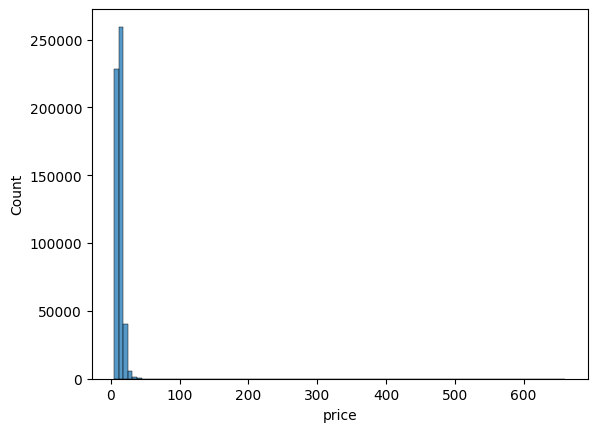

In [43]:
sns.histplot(dt_pd['price'], bins=100)

<Axes: xlabel='price', ylabel='Count'>

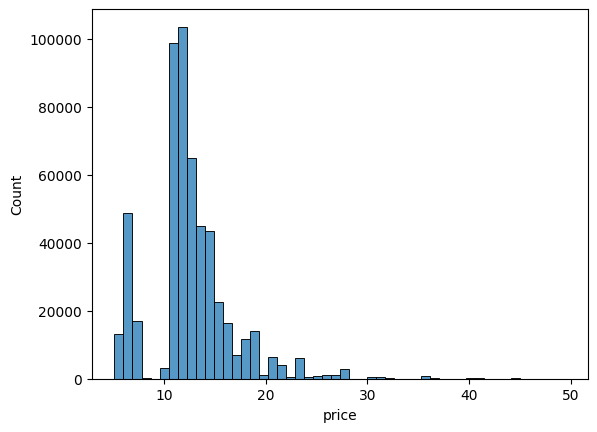

In [42]:
sns.histplot(dt_pd[dt_pd['price'] < 50]['price'], bins=50)

<Axes: xlabel='quantity', ylabel='price'>

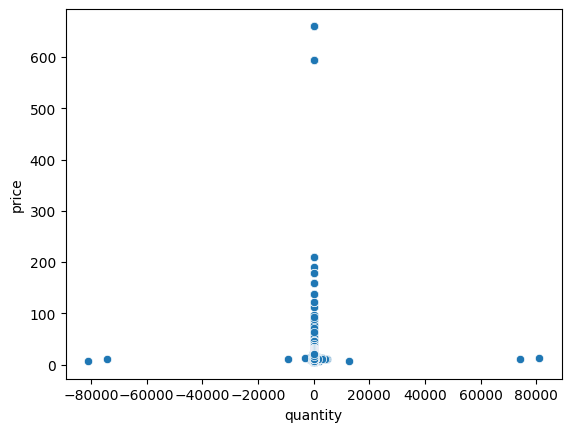

In [44]:
sns.scatterplot(x=dt_pd.quantity, y=dt_pd.price)

Interactive chart with Plotly

In [45]:
import plotly.express as px
fig = px.scatter(dt_pd, 'customer_id', 'price')
fig.show()

## Step 4 : Data Cleansing with PySpark

In [46]:
# show data
dt.show(truncate=False)

+--------------+----------+----------+-----+--------+-----------+-----------------------------------+----------------+-------------+------------------+------------------+
|transaction_id|date      |product_id|price|quantity|customer_id|product_name                       |customer_country|customer_name|total_amount      |thb_amount        |
+--------------+----------+----------+-----+--------+-----------+-----------------------------------+----------------+-------------+------------------+------------------+
|581482        |2024-05-10|22485     |21.47|12      |17490.0    |Set Of 2 Wooden Market Crates      |United Kingdom  |Sara Griffin |257.64            |11792.1828        |
|581475        |2024-05-10|22596     |10.65|36      |13069.0    |Christmas Star Wish List Chalkboard|United Kingdom  |Michael Holt |383.40000000000003|17548.218000000004|
|581475        |2024-05-10|23235     |11.53|12      |13069.0    |Storage Tin Vintage Leaf           |United Kingdom  |Michael Holt |138.359999999

In [47]:
# show schema
dt.printSchema()

root
 |-- transaction_id: string (nullable = true)
 |-- date: string (nullable = true)
 |-- product_id: string (nullable = true)
 |-- price: double (nullable = true)
 |-- quantity: long (nullable = true)
 |-- customer_id: double (nullable = true)
 |-- product_name: string (nullable = true)
 |-- customer_country: string (nullable = true)
 |-- customer_name: string (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- thb_amount: double (nullable = true)



In [48]:
# convert data type of date column from string to datetime
from pyspark.sql import functions as f

#dt_clean = dt.withColumn("date",
#                        f.to_timestamp(dt.date)
#                        )

dt_clean = dt.withColumn('date',
                         f.to_timestamp(dt.date, 'yyyy-MM-dd')
                         )

dt_clean.show()

+--------------+-------------------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|transaction_id|               date|product_id|price|quantity|customer_id|        product_name|customer_country|customer_name|      total_amount|        thb_amount|
+--------------+-------------------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|        581482|2024-05-10 00:00:00|     22485|21.47|      12|    17490.0|Set Of 2 Wooden M...|  United Kingdom| Sara Griffin|            257.64|        11792.1828|
|        581475|2024-05-10 00:00:00|     22596|10.65|      36|    13069.0|Christmas Star Wi...|  United Kingdom| Michael Holt|383.40000000000003|17548.218000000004|
|        581475|2024-05-10 00:00:00|     23235|11.53|      12|    13069.0|Storage Tin Vinta...|  United Kingdom| Michael Holt|138.35999999999999|         6332.7372|
|        5

In [49]:
# check data after convert data type
dt_clean.select(
    f.min(dt_clean.date),\
    f.max(dt_clean.date)
).show()

+-------------------+-------------------+
|          min(date)|          max(date)|
+-------------------+-------------------+
|2023-05-03 00:00:00|2024-05-10 00:00:00|
+-------------------+-------------------+



In [50]:
dt_clean.printSchema()

root
 |-- transaction_id: string (nullable = true)
 |-- date: timestamp (nullable = true)
 |-- product_id: string (nullable = true)
 |-- price: double (nullable = true)
 |-- quantity: long (nullable = true)
 |-- customer_id: double (nullable = true)
 |-- product_name: string (nullable = true)
 |-- customer_country: string (nullable = true)
 |-- customer_name: string (nullable = true)
 |-- total_amount: double (nullable = true)
 |-- thb_amount: double (nullable = true)



In [51]:
# count the number of transactions for the first half of January 2024
dt_clean.where( (f.dayofmonth(dt_clean.date) <=15) & (f.month(dt_clean.date) == 1) & (f.year(dt_clean.date) == 2024) ).count()

16398

### Anomalies Check

- Syntactical Anomalies -> Lexical errors

In [53]:
print('Customer Country count :', dt_clean.select('customer_country').distinct().count())

Customer Country count : 39


In [54]:
dt_clean.select('customer_country').distinct().sort('customer_country').show(40)

+--------------------+
|    customer_country|
+--------------------+
|           Australia|
|             Austria|
|             Bahrain|
|             Belgium|
|              Brazil|
|              Canada|
|     Channel Islands|
|              Cyprus|
|      Czech Republic|
|             Denmark|
|                EIRE|
|  European Community|
|             Finland|
|              France|
|             Germany|
|              Greece|
|           Hong Kong|
|             Iceland|
|              Israel|
|               Italy|
|               Japan|
|              Japane|
|             Lebanon|
|           Lithuania|
|               Malta|
|         Netherlands|
|              Norway|
|              Poland|
|            Portugal|
|                 RSA|
|        Saudi Arabia|
|           Singapore|
|               Spain|
|              Sweden|
|         Switzerland|
|                 USA|
|United Arab Emirates|
|      United Kingdom|
|         Unspecified|
+--------------------+



In [56]:
# There is no Japane country
dt_clean.where(dt_clean['customer_country'] == 'Japane').show()

+--------------+-------------------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------+-----------+
|transaction_id|               date|product_id|price|quantity|customer_id|        product_name|customer_country|customer_name|total_amount| thb_amount|
+--------------+-------------------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------+-----------+
|        566623|2024-02-14 00:00:00|     21787|11.12|      72|    12756.0|Rain Poncho Retro...|          Japane|    Troy Ball|      800.64|36331.44192|
|        566623|2024-02-14 00:00:00|     21786|10.68|      24|    12756.0|   Polkadot Rain Hat|          Japane|    Troy Ball|      256.32|11631.28896|
|        566623|2024-02-14 00:00:00|     21789|11.12|      24|    12756.0|  Kids Rain Mac Pink|          Japane|    Troy Ball|      266.88|12110.48064|
|        566623|2024-02-14 00:00:00|     21788|11.12|      24|    12756.0|  Kids Rain Ma

In [57]:
from pyspark.sql.functions import when

dt_clean_country = dt_clean.withColumn('customer_country_upd', when(dt_clean['customer_country'] == 'Japane', 'Japan').otherwise(dt_clean['customer_country']))

In [62]:
dt_clean_country.select('customer_country_upd').distinct().sort('customer_country_upd').show(40)
print('Customer Country count :', dt_clean_country.select('customer_country_upd').distinct().count())

+--------------------+
|customer_country_upd|
+--------------------+
|           Australia|
|             Austria|
|             Bahrain|
|             Belgium|
|              Brazil|
|              Canada|
|     Channel Islands|
|              Cyprus|
|      Czech Republic|
|             Denmark|
|                EIRE|
|  European Community|
|             Finland|
|              France|
|             Germany|
|              Greece|
|           Hong Kong|
|             Iceland|
|              Israel|
|               Italy|
|               Japan|
|             Lebanon|
|           Lithuania|
|               Malta|
|         Netherlands|
|              Norway|
|              Poland|
|            Portugal|
|                 RSA|
|        Saudi Arabia|
|           Singapore|
|               Spain|
|              Sweden|
|         Switzerland|
|                 USA|
|United Arab Emirates|
|      United Kingdom|
|         Unspecified|
+--------------------+

Customer Country count : 38


In [63]:
dt_clean_country.show()

+--------------+-------------------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+--------------------+
|transaction_id|               date|product_id|price|quantity|customer_id|        product_name|customer_country|customer_name|      total_amount|        thb_amount|customer_country_upd|
+--------------+-------------------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+--------------------+
|        581482|2024-05-10 00:00:00|     22485|21.47|      12|    17490.0|Set Of 2 Wooden M...|  United Kingdom| Sara Griffin|            257.64|        11792.1828|      United Kingdom|
|        581475|2024-05-10 00:00:00|     22596|10.65|      36|    13069.0|Christmas Star Wi...|  United Kingdom| Michael Holt|383.40000000000003|17548.218000000004|      United Kingdom|
|        581475|2024-05-10 00:00:00|     23235|11.53|      12|    1306

In [65]:
dt_clean_v2 = dt_clean_country.drop('customer_country').withColumnRenamed('customer_country_upd', 'customer_country')

In [66]:
dt_clean_v2[dt_clean_v2.transaction_id == '566623'].show()

+--------------+-------------------+----------+-----+--------+-----------+--------------------+-------------+------------+-----------+----------------+
|transaction_id|               date|product_id|price|quantity|customer_id|        product_name|customer_name|total_amount| thb_amount|customer_country|
+--------------+-------------------+----------+-----+--------+-----------+--------------------+-------------+------------+-----------+----------------+
|        566623|2024-02-14 00:00:00|     21787|11.12|      72|    12756.0|Rain Poncho Retro...|    Troy Ball|      800.64|36331.44192|           Japan|
|        566623|2024-02-14 00:00:00|     21786|10.68|      24|    12756.0|   Polkadot Rain Hat|    Troy Ball|      256.32|11631.28896|           Japan|
|        566623|2024-02-14 00:00:00|     21789|11.12|      24|    12756.0|  Kids Rain Mac Pink|    Troy Ball|      266.88|12110.48064|           Japan|
|        566623|2024-02-14 00:00:00|     21788|11.12|      24|    12756.0|  Kids Rain Ma

- Semantic Anomalies -> Integrity constraints

In [71]:
dt_clean_v2.select('product_id').show(100)

+----------+
|product_id|
+----------+
|     22485|
|     22596|
|     23235|
|     23272|
|     23239|
|     21705|
|     22118|
|     22119|
|     22217|
|     22216|
|     22380|
|     22442|
|     22664|
|     22721|
|     22723|
|     22785|
|     22955|
|     23141|
|     22956|
|     22581|
|     23198|
|     23197|
|     23184|
|     23168|
|     23167|
|     23166|
|     23165|
|     23004|
|     23002|
|     23000|
|     22998|
|     22994|
|     22835|
|     22730|
|     22728|
|     22727|
|     22726|
|     22720|
|     22693|
|     22670|
|     22667|
|     22666|
|     22631|
|     22628|
|     22467|
|     22197|
|     22114|
|     22112|
|     21908|
|     21874|
|     21872|
|     21871|
|     21533|
|     21481|
|     21479|
|     21248|
|     21216|
|     21181|
|     21175|
|     21169|
|     21162|
|     21159|
|     21158|
|     21154|
|     16016|
|     16014|
|     16008|
|     85152|
|    84596F|
|    84596B|
|    84510A|
|     82600|
|     82581|
|     72232|

In [72]:
dt_clean_v2.select('product_id').count()

536350

Replace product IDs that are longer than 5 characters with 5 characters

In [75]:
# correct value / total value must be equal to 1
dt_clean_v2.where(dt_clean_v2['product_id'].rlike('^.{5}$')).count() / dt_clean_v2.count()

0.9050601286473385

In [77]:
dt_correct_product = dt_clean_v2.filter(dt_clean_v2["product_id"].rlike("^.{5}$"))
dt_incorrect_product = dt_clean_v2.subtract(dt_correct_product)

dt_incorrect_product.show(10)

+--------------+-------------------+----------+-----+--------+-----------+--------------------+---------------+------------------+------------------+----------------+
|transaction_id|               date|product_id|price|quantity|customer_id|        product_name|  customer_name|      total_amount|        thb_amount|customer_country|
+--------------+-------------------+----------+-----+--------+-----------+--------------------+---------------+------------------+------------------+----------------+
|        581480|2024-05-10 00:00:00|    84029E|14.61|       8|    14441.0|Red Woolly Hottie...|    Thomas Hull|            116.88|         5349.5976|  United Kingdom|
|        580727|2024-05-06 00:00:00|    47504H| 5.97|       6|    14096.0|English Rose Spir...|Christine Doyle|             35.82|         1652.7348|  United Kingdom|
|        580727|2024-05-06 00:00:00|    85231B| 7.24|       1|    14096.0|Cinammon Set Of 9...|Christine Doyle|              7.24|          334.0536|  United Kingdom

In [81]:
dt_clean_v2.where(dt_clean_v2['product_id'].startswith('15044')).select('product_id', 'product_name').show(truncate=False)

+----------+--------------------+
|product_id|product_name        |
+----------+--------------------+
|15044C    |Purple Paper Parasol|
|15044A    |Pink Paper Parasol  |
|15044D    |Red Paper Parasol   |
|15044C    |Purple Paper Parasol|
|15044A    |Pink Paper Parasol  |
|15044A    |Pink Paper Parasol  |
|15044D    |Red Paper Parasol   |
|15044D    |Red Paper Parasol   |
|15044C    |Purple Paper Parasol|
|15044A    |Pink Paper Parasol  |
|15044D    |Red Paper Parasol   |
|15044A    |Pink Paper Parasol  |
|15044C    |Purple Paper Parasol|
|15044C    |Purple Paper Parasol|
|15044D    |Red Paper Parasol   |
|15044D    |Red Paper Parasol   |
|15044C    |Purple Paper Parasol|
|15044A    |Pink Paper Parasol  |
|15044A    |Pink Paper Parasol  |
|15044A    |Pink Paper Parasol  |
+----------+--------------------+
only showing top 20 rows



In [85]:
dt_clean_v3 = dt_clean_v2.withColumn('product_id', f.substring('product_id', 1, 5))

In [86]:
# check the result
dt_clean_v3.where(dt_clean_v3['product_id'].rlike('^.{5}$')).count() / dt_clean_v3.count()

1.0

- Missing Values

In [88]:
from pyspark.sql.functions import col, sum

dt_nulllist = dt_clean_v3.select([ sum(col(colname).isNull().cast('int')).alias(colname) for colname in dt_clean_v3.columns ])
dt_nulllist.show()

+--------------+----+----------+-----+--------+-----------+------------+-------------+------------+----------+----------------+
|transaction_id|date|product_id|price|quantity|customer_id|product_name|customer_name|total_amount|thb_amount|customer_country|
+--------------+----+----------+-----+--------+-----------+------------+-------------+------------+----------+----------------+
|             0|   0|         0|    0|       0|         55|           0|            0|           0|         0|               0|
+--------------+----+----------+-----+--------+-----------+------------+-------------+------------+----------+----------------+



In [91]:
dt_clean_v3.where(dt_clean_v3.customer_id.isNull()).show()

+--------------+-------------------+----------+-----+--------+-----------+--------------------+-------------+-------------------+-------------------+----------------+
|transaction_id|               date|product_id|price|quantity|customer_id|        product_name|customer_name|       total_amount|         thb_amount|customer_country|
+--------------+-------------------+----------+-----+--------+-----------+--------------------+-------------+-------------------+-------------------+----------------+
|       C581406|2024-05-09 00:00:00|     46000| 6.19|    -240|       NULL|Polyester Filler ...| Allen Morgan|-1485.6000000000001|         -68397.024|  United Kingdom|
|       C581406|2024-05-09 00:00:00|     46000| 6.19|    -300|       NULL|Polyester Filler ...| Allen Morgan|-1857.0000000000002| -85496.28000000001|  United Kingdom|
|       C575153|2024-04-09 00:00:00|     22947|44.25|      -1|       NULL|Wooden Advent Cal...| Allen Morgan|             -44.25|-2036.4734999999998|  United Kingdom

In [92]:
dt_clean_v3.select('customer_id').distinct().show()

+-----------+
|customer_id|
+-----------+
|    17884.0|
|    16561.0|
|    13956.0|
|    14452.0|
|    16596.0|
|    14768.0|
|    13094.0|
|    14285.0|
|    16916.0|
|    17633.0|
|    13607.0|
|    13918.0|
|    14473.0|
|    16629.0|
|    12671.0|
|    14024.0|
|    17267.0|
|    15776.0|
|    12493.0|
|    13533.0|
+-----------+
only showing top 20 rows



Replace customer IDs which are Null to 00000

In [94]:
dt_clean_v4 = dt_clean_v3.withColumn('customer_id', when(dt_clean_v3['customer_id'].isNull(), '00000').otherwise(dt_clean_v3['customer_id']))

In [95]:
dt_clean_v4.where(dt_clean_v4.customer_id.isNull()).show()

+--------------+----+----------+-----+--------+-----------+------------+-------------+------------+----------+----------------+
|transaction_id|date|product_id|price|quantity|customer_id|product_name|customer_name|total_amount|thb_amount|customer_country|
+--------------+----+----------+-----+--------+-----------+------------+-------------+------------+----------+----------------+
+--------------+----+----------+-----+--------+-----------+------------+-------------+------------+----------+----------------+



- Outliers

<Axes: xlabel='price'>

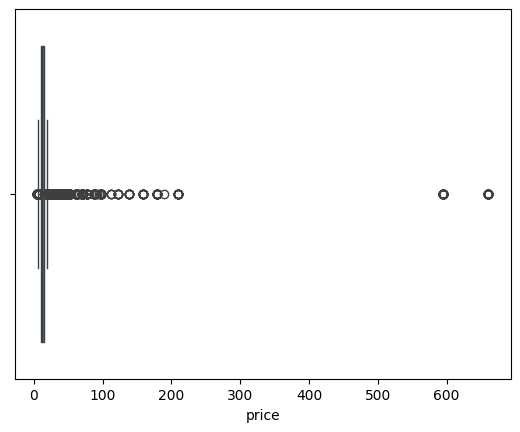

In [96]:
sns.boxplot(x=dt_clean_v2.toPandas()['price'])

In [98]:
dt_clean_v4.where(dt_clean_v4.price > 600).select('product_id', 'product_name', 'price').distinct().show()

+----------+--------------------+------+
|product_id|        product_name| price|
+----------+--------------------+------+
|     22656|Vintage Blue Kitc...|660.62|
|     22655|Vintage Red Kitch...|660.62|
+----------+--------------------+------+



### Clean data with Spark SQL

In [100]:
dt.createOrReplaceTempView('data')
dt_sql = spark.sql('select * from data')
dt_sql.show()

+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|transaction_id|      date|product_id|price|quantity|customer_id|        product_name|customer_country|customer_name|      total_amount|        thb_amount|
+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|        581482|2024-05-10|     22485|21.47|      12|    17490.0|Set Of 2 Wooden M...|  United Kingdom| Sara Griffin|            257.64|        11792.1828|
|        581475|2024-05-10|     22596|10.65|      36|    13069.0|Christmas Star Wi...|  United Kingdom| Michael Holt|383.40000000000003|17548.218000000004|
|        581475|2024-05-10|     23235|11.53|      12|    13069.0|Storage Tin Vinta...|  United Kingdom| Michael Holt|138.35999999999999|         6332.7372|
|        581475|2024-05-10|     23272|10.65|      12|    13069.0

In [104]:
dt_sql_country = spark.sql("""
   select distinct customer_country
   from data
   order by customer_country
""")
dt_sql_country.show(40)

+--------------------+
|    customer_country|
+--------------------+
|           Australia|
|             Austria|
|             Bahrain|
|             Belgium|
|              Brazil|
|              Canada|
|     Channel Islands|
|              Cyprus|
|      Czech Republic|
|             Denmark|
|                EIRE|
|  European Community|
|             Finland|
|              France|
|             Germany|
|              Greece|
|           Hong Kong|
|             Iceland|
|              Israel|
|               Italy|
|               Japan|
|              Japane|
|             Lebanon|
|           Lithuania|
|               Malta|
|         Netherlands|
|              Norway|
|              Poland|
|            Portugal|
|                 RSA|
|        Saudi Arabia|
|           Singapore|
|               Spain|
|              Sweden|
|         Switzerland|
|                 USA|
|United Arab Emirates|
|      United Kingdom|
|         Unspecified|
+--------------------+



In [108]:
# clean customer country with sql
dt_sql_transform = spark.sql("""
select
    transaction_id,
    date,
    product_id,
    price,
    quantity,
    customer_id,
    product_name,
    case when customer_country = 'Japane' then 'Japan' else customer_country end as customer_country,
    customer_name,
    total_amount,
    thb_amount
from
    data
""")
dt_sql_transform.select("customer_country").distinct().sort("customer_country").show(50)

+--------------------+
|    customer_country|
+--------------------+
|           Australia|
|             Austria|
|             Bahrain|
|             Belgium|
|              Brazil|
|              Canada|
|     Channel Islands|
|              Cyprus|
|      Czech Republic|
|             Denmark|
|                EIRE|
|  European Community|
|             Finland|
|              France|
|             Germany|
|              Greece|
|           Hong Kong|
|             Iceland|
|              Israel|
|               Italy|
|               Japan|
|             Lebanon|
|           Lithuania|
|               Malta|
|         Netherlands|
|              Norway|
|              Poland|
|            Portugal|
|                 RSA|
|        Saudi Arabia|
|           Singapore|
|               Spain|
|              Sweden|
|         Switzerland|
|                 USA|
|United Arab Emirates|
|      United Kingdom|
|         Unspecified|
+--------------------+



In [109]:
dt_sql_transform.show()

+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|transaction_id|      date|product_id|price|quantity|customer_id|        product_name|customer_country|customer_name|      total_amount|        thb_amount|
+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|        581482|2024-05-10|     22485|21.47|      12|    17490.0|Set Of 2 Wooden M...|  United Kingdom| Sara Griffin|            257.64|        11792.1828|
|        581475|2024-05-10|     22596|10.65|      36|    13069.0|Christmas Star Wi...|  United Kingdom| Michael Holt|383.40000000000003|17548.218000000004|
|        581475|2024-05-10|     23235|11.53|      12|    13069.0|Storage Tin Vinta...|  United Kingdom| Michael Holt|138.35999999999999|         6332.7372|
|        581475|2024-05-10|     23272|10.65|      12|    13069.0

In [111]:
# clean product_id with sql
dt_sql_check_product_id = spark.sql("""
select *
from data
where product_id not like '^.{5}$'
""").show()

+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|transaction_id|      date|product_id|price|quantity|customer_id|        product_name|customer_country|customer_name|      total_amount|        thb_amount|
+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|        581482|2024-05-10|     22485|21.47|      12|    17490.0|Set Of 2 Wooden M...|  United Kingdom| Sara Griffin|            257.64|        11792.1828|
|        581475|2024-05-10|     22596|10.65|      36|    13069.0|Christmas Star Wi...|  United Kingdom| Michael Holt|383.40000000000003|17548.218000000004|
|        581475|2024-05-10|     23235|11.53|      12|    13069.0|Storage Tin Vinta...|  United Kingdom| Michael Holt|138.35999999999999|         6332.7372|
|        581475|2024-05-10|     23272|10.65|      12|    13069.0

In [112]:
dt_sql_productid_clean = spark.sql("""
select
    transaction_id,
    date,
    case
      when length(product_id) > 5
      then substr(product_id, 1, 5)
      else product_id
    end as product_id,
    price,
    quantity,
    customer_id,
    product_name,
    customer_country,
    customer_name,
    total_amount,
    thb_amount
from
    data
""")
dt_sql_productid_clean.show()

+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|transaction_id|      date|product_id|price|quantity|customer_id|        product_name|customer_country|customer_name|      total_amount|        thb_amount|
+--------------+----------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|        581482|2024-05-10|     22485|21.47|      12|    17490.0|Set Of 2 Wooden M...|  United Kingdom| Sara Griffin|            257.64|        11792.1828|
|        581475|2024-05-10|     22596|10.65|      36|    13069.0|Christmas Star Wi...|  United Kingdom| Michael Holt|383.40000000000003|17548.218000000004|
|        581475|2024-05-10|     23235|11.53|      12|    13069.0|Storage Tin Vinta...|  United Kingdom| Michael Holt|138.35999999999999|         6332.7372|
|        581475|2024-05-10|     23272|10.65|      12|    13069.0

In [113]:
dt_sql_productid_clean.filter(~dt_sql_productid_clean["product_id"].rlike("^.{5}$")).show()

+--------------+----+----------+-----+--------+-----------+------------+----------------+-------------+------------+----------+
|transaction_id|date|product_id|price|quantity|customer_id|product_name|customer_country|customer_name|total_amount|thb_amount|
+--------------+----+----------+-----+--------+-----------+------------+----------------+-------------+------------+----------+
+--------------+----+----------+-----+--------+-----------+------------+----------------+-------------+------------+----------+



## Step 5 : Data Export in PySpark

In [114]:
dt_clean.write.parquet("cleaned_data_output.parquet")

In [115]:
# check parquet file
dt2 = spark.read.parquet("cleaned_data_output.parquet")

dt2.show(10)

+--------------+-------------------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|transaction_id|               date|product_id|price|quantity|customer_id|        product_name|customer_country|customer_name|      total_amount|        thb_amount|
+--------------+-------------------+----------+-----+--------+-----------+--------------------+----------------+-------------+------------------+------------------+
|        581482|2024-05-10 00:00:00|     22485|21.47|      12|    17490.0|Set Of 2 Wooden M...|  United Kingdom| Sara Griffin|            257.64|        11792.1828|
|        581475|2024-05-10 00:00:00|     22596|10.65|      36|    13069.0|Christmas Star Wi...|  United Kingdom| Michael Holt|383.40000000000003|17548.218000000004|
|        581475|2024-05-10 00:00:00|     23235|11.53|      12|    13069.0|Storage Tin Vinta...|  United Kingdom| Michael Holt|138.35999999999999|         6332.7372|
|        5